In [1]:
import pandas as pd
import itertools
import networkx as nx
import collections
import os
import pyarrow.parquet as pq
import numpy as np
#import folium
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline

import plotly.express as px
from scipy import stats

import matplotlib.colors as mcolors


import geopandas as gpd
# URL ufficiale Natural Earth (110m, paesi)
url = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)

In [57]:
countryDF = pd.read_csv('../data/Floriana_country_info.csv')
id2nameC=dict(zip(countryDF['alpha-2'],countryDF['name']))
id2region=dict(zip(countryDF['alpha-2'],countryDF['region']))
id2subregion=dict(zip(countryDF['alpha-2'],countryDF['sub-region']))

id2nameC['XK']='Kosovo'
id2region['XK']='Europe'
id2subregion['XK']='Southern Europe'

countryname2iso3=dict(zip(countryDF['name'],countryDF['alpha-3']))
countryname2iso3['Kosovo'] = 'XKX'


In [58]:
dfTopics=pd.read_csv('../data/topic_mapping_table_19022024.csv')
dfTopics['topic_id']=dfTopics['topic_id'].apply(lambda x: 'T'+str(x))
id2name=dict(zip(dfTopics['topic_id'],dfTopics['topic_name']))
id2field=dict(zip(dfTopics['topic_id'],dfTopics['field_name']))
id2subfield=dict(zip(dfTopics['topic_id'],dfTopics['subfield_id']))
subfieldid2name=dict(zip(dfTopics['subfield_id'],dfTopics['subfield_name']))

In [59]:
import networkx as nx
G = nx.Graph()
G.add_edges_from(zip(dfTopics['subfield_id'], dfTopics['field_id']))
G.add_edges_from(zip(dfTopics['field_id'], dfTopics['domain_id']))
for i in set(dfTopics['domain_id']):
    G.add_edge(i, 'ALL')

#distances
distances = dict(nx.all_pairs_shortest_path_length(G))


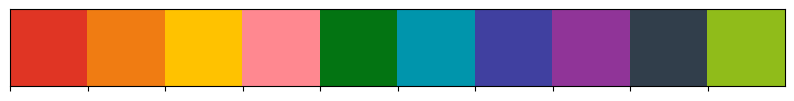

In [60]:
#selCountries=['CN','US','BR','MA','RU','FR','IN','ZA','DE','ID']
#colorsCountries=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33','#a65628','#f781bf','black',"#0b8076"]
selCountries=['CN','RU','BR','ZA','US','FR','MA','IR','ID']
colorsCountries=['#e03524','#f07c12','#ffc200',"#ff868efa","#037412",'#0095ac','#4040a0','#903498',"#313e4b",'#90bc1a']

coldict = dict(zip(selCountries, colorsCountries))

DARK_GREY = "#0D1117"

#plot the palette
sns.palplot(colorsCountries)

In [61]:
dfInfo=pd.read_csv('../data/countryStats_V_clean.csv')

In [62]:
years=list(range(1970,2024))
countries=list(set(dfInfo['country']))

In [63]:
ff=dfInfo.groupby('year').agg({'nPapers':'sum', 'nPapersUnique':'sum'}).reset_index()
ff['fraction'] = ff['nPapersUnique'] / ff['nPapers']
dd=dfInfo[dfInfo['nPapers']>=100]
dd['fraction'] = dd['nPapersUnique'] / dd['nPapers']

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3732424262.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dd['fraction'] = dd['nPapersUnique'] / dd['nPapers']


In [64]:
dd.year = dd['year'].astype(int)

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/2691805340.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dd.year = dd['year'].astype(int)


## FRACTION NATIONAL

In [65]:
def create_rankings(df, columns):
    rank_columns = ["rank_{}".format(i) for i in range(len(columns))]
    for i, column in enumerate(columns):
        df[rank_columns[i]] = df[column].rank(ascending=False)
    

    return df, rank_columns

dfRankings1983 = dfInfo[dfInfo['year'] == 1983].copy()
dfRankings1983, rank_columns = create_rankings(dfRankings1983[['country','nPapers']], ['nPapers'])
dfRankings1993 = dfInfo[dfInfo['year'] == 1993].copy()
dfRankings1993, rank_columns = create_rankings(dfRankings1993[['country','nPapers']], ['nPapers'])
dfRankings2003 = dfInfo[dfInfo['year'] == 2003].copy()
dfRankings2003, rank_columns = create_rankings(dfRankings2003[['country','nPapers']], ['nPapers'])
dfRankings2013 = dfInfo[dfInfo['year'] == 2013].copy()
dfRankings2013, rank_columns = create_rankings(dfRankings2013[['country','nPapers']], ['nPapers'])
dfRankings2023 = dfInfo[dfInfo['year'] == 2023].copy()
dfRankings2023, rank_columns = create_rankings(dfRankings2023[['country','nPapers']], ['nPapers'])

r83=dfRankings1983[dfRankings1983['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'1983'})
r93=dfRankings1993[dfRankings1993['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'1993'})
r03=dfRankings2003[dfRankings2003['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'2003'})
r13=dfRankings2013[dfRankings2013['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'2013'})
r23=dfRankings2023[dfRankings2023['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'2023'})

ranks = r83.merge(r93, on='country').merge(r03, on='country').merge(r13, on='country').merge(r23, on='country')
ranks.set_index('country', inplace=True)

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3146042490.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[rank_columns[i]] = df[column].rank(ascending=False)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3146042490.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[rank_columns[i]] = df[column].rank(ascending=False)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3146042490.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy o

In [66]:
dd.query("year >= 1974")

,country,entropy,nPapersUnique,nSubfields,normEntropy,maxEntropy,kl,year,nPapers,fraction
695,AR,6.187769,402,109,0.914244,6.768184,1.240132,1974,454,0.885463
697,AT,6.398057,804,146,0.889877,7.189825,0.795383,1974,902,0.891353
698,AU,6.945178,5182,216,0.895587,7.754888,0.138574,1974,5648,0.917493
703,BE,6.462309,1377,165,0.877278,7.366322,0.455692,1974,1567,0.878749
705,BG,5.367159,338,86,0.835191,6.426265,2.146889,1974,381,0.887139
...,...,...,...,...,...,...,...,...,...,...
10673,XK,5.850062,437,107,0.867773,6.741467,1.966173,2023,851,0.513514
10674,YE,6.527813,950,155,0.897155,7.276124,1.030714,2023,2267,0.419056
10675,ZA,6.744776,19693,241,0.852378,7.912889,0.250082,2023,32250,0.610636
10676,ZM,6.306981,717,138,0.887242,7.108524,1.703950,2023,1583,0.452937


In [67]:
plt.rcParams["font.family"] = "sans-serif"
# plt.rcParams["font.style"] = "italic"

In [68]:
dd_dist=pd.read_csv('../data/df_box_modes.csv')
dd_dist.year = dd_dist['year'].astype(int)

In [69]:
new_row = pd.DataFrame([{
    "country": np.nan,
    "year": 1973,
    "distance": np.nan
}])

dd_dist = pd.concat([dd_dist, new_row], ignore_index=True)

In [70]:
years_full = np.arange(1973, 2024)

dd_dist['year'] = pd.Categorical(
    dd_dist['year'],
    categories=years_full,
    ordered=True
)

In [71]:
dd_dist

,country,year,distance
0,AE,2005,0.343832
1,AE,2006,0.245593
2,AE,2007,0.222750
3,AE,2008,0.191893
4,AE,2009,0.184795
...,...,...,...
3155,ZW,2020,0.370222
3156,ZW,2021,0.345625
3157,ZW,2022,0.305713
3158,ZW,2023,0.292588


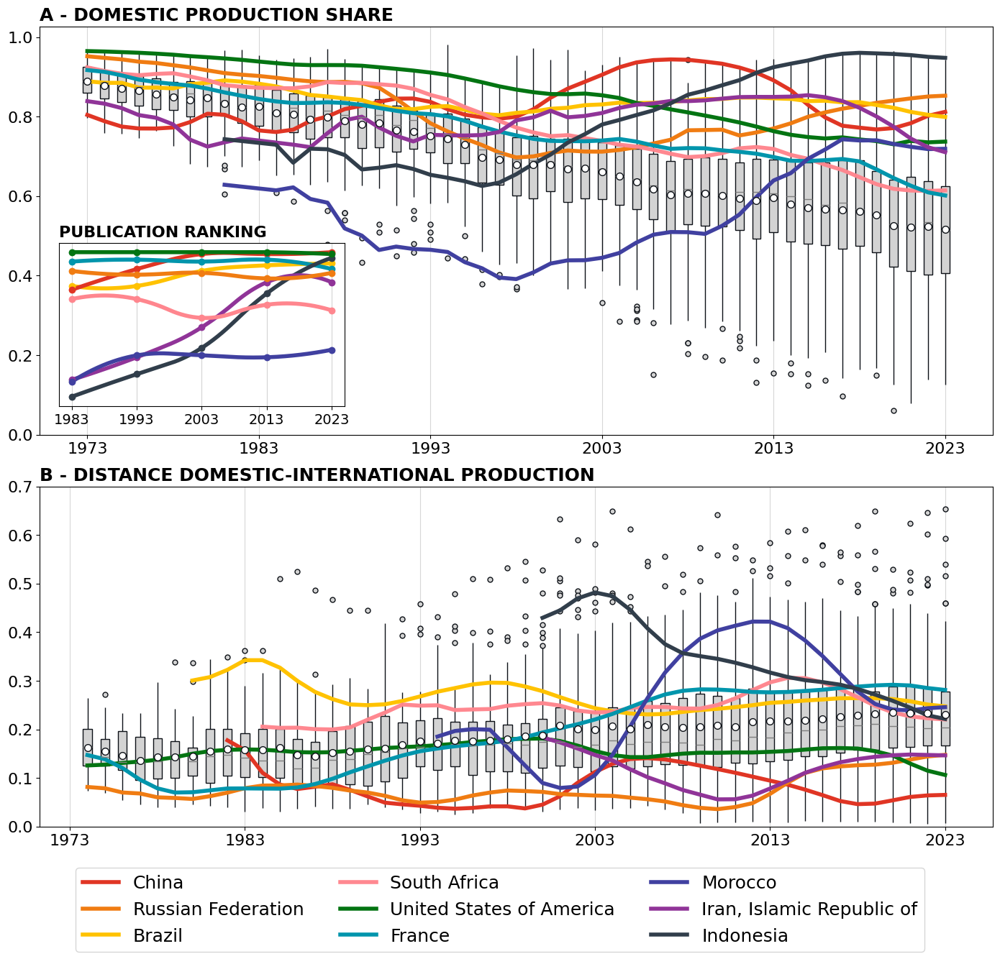

In [85]:
fig, (ax, ax2) = plt.subplots(figsize=(14, 12), nrows=2, height_ratios=[1.2, 1])

base_fontsize = 16

dd_plot = dd.query("year >= 1973")

years = sorted(dd_plot['year'].unique())
years_plot = np.arange(1973, 2024, 10).astype(str)

sns.boxplot(data=dd_plot, x='year', y='fraction', order=years,
            color='lightgrey', width=0.5, showfliers=True, showmeans=True,
            boxprops={"edgecolor": "#0D1117", "linewidth": 1, "facecolor": "lightgrey"},
            meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"#0D1117", "markersize":"7",},
            whiskerprops={"color":"#0D1117", "linewidth":1},
            capprops={"color":"#0D1117", "linewidth":0},
            flierprops={"marker":"o", "markerfacecolor":"lightgrey", "markeredgecolor":"#0D1117", "markersize":5},
            saturation=0.8, ax=ax)

for i in selCountries:
    dfTemp = dd_plot[dd_plot['country'] == i].sort_values('year').copy()
    # display(dfTemp)
    dfTemp['fraction_smooth'] = dfTemp['fraction'].rolling(window=3, center=True, min_periods=1).mean()
    x_pos = [years.index(y) for y in dfTemp['year']]
    # print(x_pos)
    ax.plot(x_pos, dfTemp['fraction_smooth'], color=colorsCountries[selCountries.index(i)], label=id2nameC[i], linewidth=4)

ax.set_ylabel(None)
ax.set_xticks(years_plot)
ax.set_xticklabels(years_plot, fontsize=base_fontsize)
ax.set_yticks(np.round(np.linspace(0, 1, 6), 1))
ax.set_yticklabels(np.round(np.linspace(0, 1, 6), 1), fontsize=base_fontsize)

ax.set_title("A - DOMESTIC PRODUCTION SHARE", fontsize=18, loc="left", fontweight='bold')
ax.grid(axis='x', linestyle='-', alpha=0.5)
ax.set(xlabel=None, ylabel=None)

# inset plot (your "subsection")
ax_inset = ax.inset_axes([0.02, 0.07, 0.3, 0.4])  
# [left, bottom, width, height] in axis fraction

ax_inset.set_title("PUBLICATION RANKING", loc="left", fontsize=base_fontsize, fontweight='bold')

df = pd.DataFrame(ranks).T
periods = df.index.tolist()
countries = df.columns.tolist()

x = np.arange(len(periods))
x_smooth = np.linspace(0, len(periods) - 1, 400)

all_ranks = df.values.flatten()
y_min, y_max = int(all_ranks.min()), int(all_ranks.max())

for xi in x:
    ax_inset.axvline(xi, color="lightgrey", alpha=1, linewidth=0.8, zorder=0)

for country in countries:
    y = df[country].values.astype(float)
    color = coldict[country] 

    spline = make_interp_spline(x, y, k=2)
    y_smooth = 80-spline(x_smooth)

    #ax.plot(x_smooth, y_smooth, color=color, linewidth=10, alpha=0.07, zorder=1)
    ax_inset.plot(x_smooth, y_smooth, color=color, linewidth=4, alpha=1, zorder=2, solid_capstyle="round")
    ax_inset.scatter(x, 80-y, color=color, s=50, zorder=5, edgecolors="#0D1117", linewidths=0)

#remove axes
ax_inset.set_xticks(x)
ax_inset.set_xticklabels(periods, fontsize=base_fontsize-2)
ax_inset.set_yticks([])
ax_inset.set_ylim(80-y_max-5, 80-y_min+5)

ax2.set_title("B - DISTANCE DOMESTIC-INTERNATIONAL PRODUCTION", fontsize=18, loc="left", fontweight='bold')

sns.boxplot(data=dd_dist, x='year', y='distance', order=years,
            color='lightgrey', width=0.5, showfliers=True, showmeans=True,
            boxprops={"edgecolor": "#0D1117", "linewidth": 1, "facecolor": "lightgrey"},
            meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"#0D1117", "markersize":"7",},
            whiskerprops={"color":"#0D1117", "linewidth":1},
            capprops={"color":"#0D1117", "linewidth":0},
            flierprops={"marker":"o", "markerfacecolor":"lightgrey", "markeredgecolor":"#0D1117", "markersize":5},
            saturation=0.8,
            ax=ax2)

for i in selCountries:
    dfTemp = dd_dist[dd_dist['country'] == i].sort_values('year').copy()
    dfTemp['fraction_smooth'] = dfTemp['distance'].rolling(window=3, center=True, min_periods=1).mean()
    x_pos = [years.index(y) for y in dfTemp['year']]
    ax2.plot(x_pos, dfTemp['fraction_smooth'], color=colorsCountries[selCountries.index(i)], linewidth=4)
    
ax2.set_xlabel(None)
ax2.set_ylabel(None)
ax2.set_xticks(years_plot)
ax2.set_yticks(np.round(np.linspace(0, 0.7, 8), 1))
ax2.set_yticklabels(np.round(np.linspace(0, 0.7, 8), 1), fontsize=base_fontsize)
ax2.set_xticklabels(years_plot, fontsize=base_fontsize)
ax2.set_ylim(0, 0.7)
ax2.grid(axis='x', linestyle='-', alpha=0.5)

_ = fig.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, 0),  # slightly above the plot
    ncol=3,
    frameon=True,
    fontsize=18,
)
# plt.ylabel('Fraction of unique papers', fontsize=14)
#plt.grid()
fig.tight_layout()
# plt.show()
plt.savefig('../images/fig_local_global_v2.jpg', dpi=1000, bbox_inches='tight')

In [73]:
def create_rankings(df, columns):
    rank_columns = ["rank_{}".format(i) for i in range(len(columns))]
    for i, column in enumerate(columns):
        df[rank_columns[i]] = df[column].rank(ascending=False)
    

    return df, rank_columns

In [74]:
dfRankings1983 = dfInfo[dfInfo['year'] == 1983].copy()
dfRankings1983, rank_columns = create_rankings(dfRankings1983[['country','nPapers']], ['nPapers'])
dfRankings1993 = dfInfo[dfInfo['year'] == 1993].copy()
dfRankings1993, rank_columns = create_rankings(dfRankings1993[['country','nPapers']], ['nPapers'])
dfRankings2003 = dfInfo[dfInfo['year'] == 2003].copy()
dfRankings2003, rank_columns = create_rankings(dfRankings2003[['country','nPapers']], ['nPapers'])
dfRankings2013 = dfInfo[dfInfo['year'] == 2013].copy()
dfRankings2013, rank_columns = create_rankings(dfRankings2013[['country','nPapers']], ['nPapers'])
dfRankings2023 = dfInfo[dfInfo['year'] == 2023].copy()
dfRankings2023, rank_columns = create_rankings(dfRankings2023[['country','nPapers']], ['nPapers'])

r83=dfRankings1983[dfRankings1983['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'1983'})
r93=dfRankings1993[dfRankings1993['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'1993'})
r03=dfRankings2003[dfRankings2003['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'2003'})
r13=dfRankings2013[dfRankings2013['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'2013'})
r23=dfRankings2023[dfRankings2023['country'].isin(selCountries)][['country','rank_0']].rename(columns={'rank_0':'2023'})

ranks = r83.merge(r93, on='country').merge(r03, on='country').merge(r13, on='country').merge(r23, on='country')
ranks.set_index('country', inplace=True)

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3000706652.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[rank_columns[i]] = df[column].rank(ascending=False)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3000706652.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[rank_columns[i]] = df[column].rank(ascending=False)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3000706652.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy o

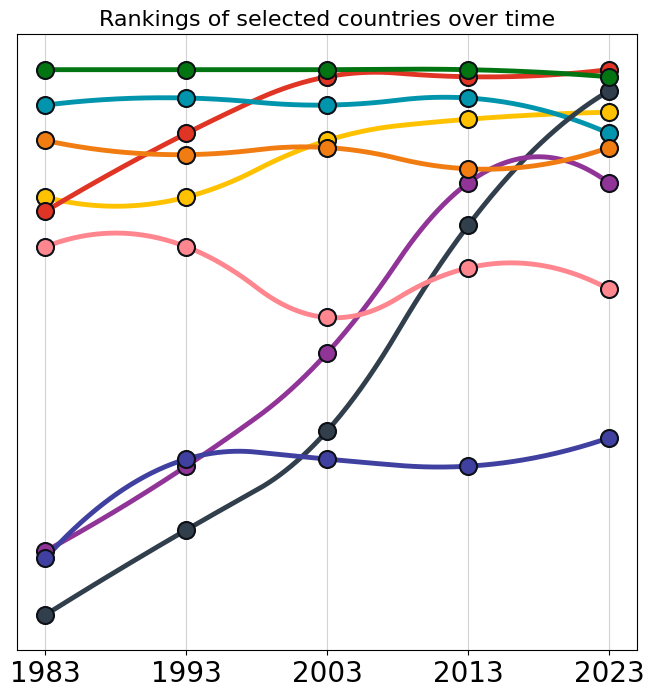

In [75]:


df = pd.DataFrame(ranks).T
periods = df.index.tolist()
countries = df.columns.tolist()



x = np.arange(len(periods))
x_smooth = np.linspace(0, len(periods) - 1, 400)

all_ranks = df.values.flatten()
y_min, y_max = int(all_ranks.min()), int(all_ranks.max())

fig, ax = plt.subplots(figsize=(8, 8))
for xi in x:
    ax.axvline(xi, color="lightgray", alpha=1, linewidth=0.8, zorder=0)

for country in countries:
    y = df[country].values.astype(float)
    color = coldict[country] 

    spline = make_interp_spline(x, y, k=2)
    y_smooth = 80-spline(x_smooth)

    
    #ax.plot(x_smooth, y_smooth, color=color, linewidth=10, alpha=0.07, zorder=1)
    ax.plot(x_smooth, y_smooth, color=color, linewidth=3.5, alpha=1,zorder=2, solid_capstyle="round")
    ax.scatter(x, 80-y, color=color, s=150, zorder=5,edgecolors="#0D1117", linewidths=1.5)

#remove axes
ax.set_xticks(x)
ax.set_xticklabels(periods, fontsize=20)
ax.set_yticks([])
ax.set_ylim(80-y_max-5, 80-y_min+5)
ax.set_title("Rankings of selected countries over time", fontsize=16)
plt.show()

## TEMPORAL EVOLUTION OF PROFILES

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:12: RuntimeWarning: invalid value encountered in divide
  js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:13: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:12: RuntimeWarning: invalid value encountered in divide
  js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:13: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:13: RuntimeWarning: divide by zero encountered in log
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83

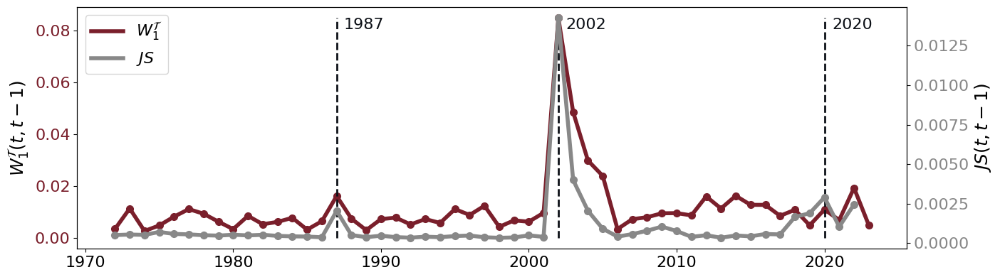

In [76]:
# --- Dati JS (già calcolato sopra, altrimenti ricalcola) ---
profiles = pd.read_csv('../data/aggregatePapersBySubfieldByYear.csv')
subfield_cols = [c for c in profiles.columns if c != 'year']
profiles[subfield_cols] = profiles[subfield_cols].div(profiles[subfield_cols].sum(axis=1), axis=0)


dfJScontrib = pd.DataFrame(columns=subfield_cols)
for y in range(1972, 2023):
    P = profiles[profiles['year'] == y-1][subfield_cols].values[0]
    Q = profiles[profiles['year'] == y  ][subfield_cols].values[0]
    M = 0.5 * (P + Q)
    js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
               + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
    dfJScontrib.loc[y] = js_contrib
dfJS = dfJScontrib.sum(axis=1).reset_index().rename(columns={'index': 'year', 0: 'JS_divergence'})

# --- Dati W1 ---
dfw1 = pd.read_csv('../data/w1dist_aggregate_year.csv')
dfw1 = dfw1[dfw1['year_to'] >= 1972]

# --- Plot ---
color_w1 = '#903498'
# color_w1 = "#4040a0"
color_w1 = "#7A1F2B"
color_js = '#888888'

marker_w1 = ""
marker_js = ""

vline_years = [1987, 2002, 2020]

fig, ax1 = plt.subplots(figsize=(14, 4))
ax2 = ax1.twinx()

def plot_metric(ax, x, y, color):
    #ax.vlines(x, 0, y, color=color, linewidth=1, alpha=0.7)
    # ax.plot(x, y, 'ok', markersize=4)
    ax.plot(x, y, 'o', color=color, markersize=7)
    ax.plot(x, y, color=color, linewidth=4)

plot_metric(ax1, dfw1['year_to'], dfw1['distance'],      color_w1)
plot_metric(ax2, dfJS['year'],    dfJS['JS_divergence'],  color_js)

for yr in vline_years:
    ax1.vlines(x=yr, ymin=0, ymax=max(dfw1['distance']), color=DARK_GREY, linestyle='--', linewidth=2)
    ax1.text(
        yr+0.5,
        max(dfw1['distance']),
        str(yr),
        va='top',
        ha='left',
        color=DARK_GREY,
        fontsize=base_fontsize,
    )

ax1.set_xlabel('Year')
ax1.set_ylabel(r'$W_1^{\mathcal{T}}(t, t-1)$', color='black', fontsize=base_fontsize+2, fontweight='bold')
ax2.set_ylabel(r'$JS(t, t-1)$',  color='black', fontsize=base_fontsize+2, fontweight='bold')
ax1.tick_params(axis='y', labelcolor=color_w1,labelsize=base_fontsize)
ax2.tick_params(axis='y', labelcolor=color_js,labelsize=base_fontsize)

# Legenda
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], color=color_w1, linewidth=4, label=r'$W_1^{\mathcal{T}}$'),
                   Line2D([0], [0], color=color_js,  linewidth=4, label=r'$JS$')]
ax1.legend(handles=legend_elements, loc='upper left', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=base_fontsize)
ax1.set_xlabel(None)
plt.tight_layout()
plt.savefig('../fig_w1_js_v1.jpg', dpi=1000, bbox_inches='tight')
# plt.show()

In [77]:
dfJS

,year,JS_divergence
0,1972,0.000507
1,1973,0.000541
2,1974,0.000519
3,1975,0.000705
4,1976,0.000581
5,1977,0.000550
6,1978,0.000497
7,1979,0.000474
8,1980,0.000527
9,1981,0.000486


In [78]:
from scipy.stats import zscore

In [79]:
dfw1 = (
    dfw1
    .assign(
        zscore_=lambda df: zscore(df.distance)
    )
)
dfJS = (
    dfJS
    .assign(
        zscore_=lambda df: zscore(df.JS_divergence)
    )
)

In [80]:
import plotly.express as px

In [81]:
dfw1

,year_to,distance,zscore_
1,1972,0.003383,-0.617209
2,1973,0.011309,0.006073
3,1974,0.002631,-0.676313
4,1975,0.004764,-0.508583
5,1976,0.008163,-0.241303
6,1977,0.011076,-0.012242
7,1978,0.009281,-0.153391
8,1979,0.006228,-0.393457
9,1980,0.003345,-0.620168
10,1981,0.008464,-0.217647


In [82]:
df_plot = dfw1.merge(dfJS, left_on="year_to", right_on="year")

In [83]:
df_plot.head()

,year_to,distance,zscore__x,year,JS_divergence,zscore__y
0,1972,0.003383,-0.617209,1972,0.000507,-0.268033
1,1973,0.011309,0.006073,1973,0.000541,-0.251448
2,1974,0.002631,-0.676313,1974,0.000519,-0.262364
3,1975,0.004764,-0.508583,1975,0.000705,-0.169323
4,1976,0.008163,-0.241303,1976,0.000581,-0.231262


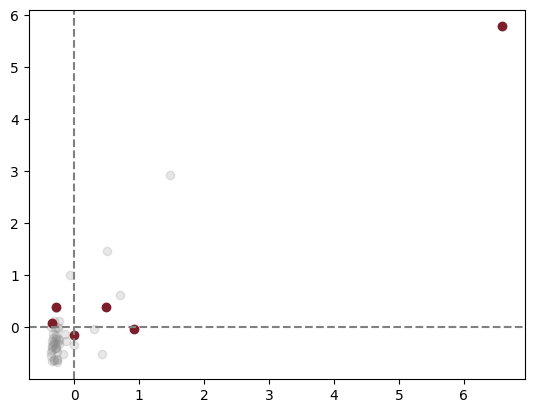

In [84]:
plt.scatter(df_plot.zscore__y, df_plot.zscore__x, color="#888888", alpha=0.2)
plt.axhline(0, color="grey", linestyle = "--")
plt.axvline(0, color="grey", linestyle = "--")
year_list = [1997, 1987, 2002, 2009, 2014, 2020]

plt.scatter(df_plot.query("year in @year_list").zscore__y, df_plot.query("year in @year_list").zscore__x, color="#7A1F2B")

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:12: RuntimeWarning: invalid value encountered in divide
  js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:13: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:12: RuntimeWarning: invalid value encountered in divide
  js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:13: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1889956152.py:13: RuntimeWarning: divide by zero encountered in log
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83

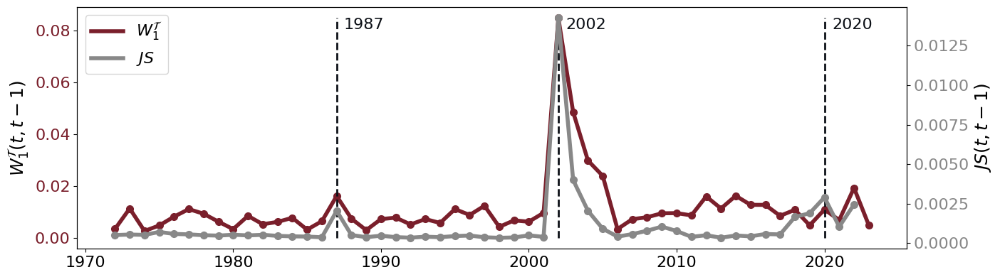

In [30]:
# --- Dati JS (già calcolato sopra, altrimenti ricalcola) ---
profiles = pd.read_csv('../data/aggregatePapersBySubfieldByYear.csv')
subfield_cols = [c for c in profiles.columns if c != 'year']
profiles[subfield_cols] = profiles[subfield_cols].div(profiles[subfield_cols].sum(axis=1), axis=0)


dfJScontrib = pd.DataFrame(columns=subfield_cols)
for y in range(1972, 2023):
    P = profiles[profiles['year'] == y-1][subfield_cols].values[0]
    Q = profiles[profiles['year'] == y  ][subfield_cols].values[0]
    M = 0.5 * (P + Q)
    js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
               + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
    dfJScontrib.loc[y] = js_contrib
dfJS = dfJScontrib.sum(axis=1).reset_index().rename(columns={'index': 'year', 0: 'JS_divergence'})

# --- Dati W1 ---
dfw1 = pd.read_csv('../data/w1dist_aggregate_year.csv')
dfw1 = dfw1[dfw1['year_to'] >= 1972]

# --- Plot ---
color_w1 = '#903498'
# color_w1 = "#4040a0"
color_w1 = "#7A1F2B"
color_js = '#888888'

marker_w1 = ""
marker_js = ""

vline_years = [1987, 2002, 2020]

fig, ax1 = plt.subplots(figsize=(14, 4))
ax2 = ax1.twinx()

def plot_metric(ax, x, y, color):
    #ax.vlines(x, 0, y, color=color, linewidth=1, alpha=0.7)
    # ax.plot(x, y, 'ok', markersize=4)
    ax.plot(x, y, 'o', color=color, markersize=7)
    ax.plot(x, y, color=color, linewidth=4)

plot_metric(ax1, dfw1['year_to'], dfw1['distance'],      color_w1)
plot_metric(ax2, dfJS['year'],    dfJS['JS_divergence'],  color_js)

for yr in vline_years:
    ax1.vlines(x=yr, ymin=0, ymax=max(dfw1['distance']), color=DARK_GREY, linestyle='--', linewidth=2)
    ax1.text(
        yr+0.5,
        max(dfw1['distance']),
        str(yr),
        va='top',
        ha='left',
        color=DARK_GREY,
        fontsize=base_fontsize,
    )

ax1.set_xlabel('Year')
ax1.set_ylabel(r'$W_1^{\mathcal{T}}(t, t-1)$', color='black', fontsize=base_fontsize+2, fontweight='bold')
ax2.set_ylabel(r'$JS(t, t-1)$',  color='black', fontsize=base_fontsize+2, fontweight='bold')
ax1.tick_params(axis='y', labelcolor=color_w1,labelsize=base_fontsize)
ax2.tick_params(axis='y', labelcolor=color_js,labelsize=base_fontsize)

# Legenda
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], color=color_w1, linewidth=4, label=r'$W_1^{\mathcal{T}}$'),
                   Line2D([0], [0], color=color_js,  linewidth=4, label=r'$JS$')]
ax1.legend(handles=legend_elements, loc='upper left', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=base_fontsize)
ax1.set_xlabel(None)
plt.tight_layout()
plt.savefig('../fig_w1_js_v1.jpg', dpi=1000, bbox_inches='tight')
# plt.show()

Figure X shows the year-over-year change in the global physics research profile as measured by two complementary metrics: the Wasserstein-1 distance (W₁, left axis) and the Jensen-Shannon divergence (JS, right axis), both computed between consecutive annual distributions over subfields.
The two metrics agree on three main structural breaks, each coinciding with a major exogenous shock. The peak around 1987–1988 aligns with the Chernobyl disaster (1986), which likely redirected research attention toward nuclear safety, radiation physics, and related subfields. The most dramatic disruption occurs in 2001–2003, where both metrics reach their global maximum: this coincides with the September 11 attacks and the subsequent surge in defense and security-related funding, which reshuffled research priorities across the physics community. Finally, elevated and volatile values after 2020 reflect the impact of the COVID-19 pandemic, which disrupted research activity globally and shifted priorities toward biophysics, complex systems, and computational approaches.
The two metrics provide complementary information about the nature of each shock. The JS divergence captures the intensity of the redistribution sharply and locally, while the W₁ distance — being sensitive to the structural distance between subfields in the hierarchy — reveals how deep the reorganization was. Notably, the slow decay of W₁ after 2002 suggests that the post-9/11 reshuffling involved subfields that were far apart in the disciplinary tree, requiring years to stabilize.

In [31]:
shock_years = [1987, 2002, 2021]

# Separa le due popolazioni
js_shock    = dfJS[dfJS['year'].isin(shock_years)]['JS_divergence']
js_baseline = dfJS[~dfJS['year'].isin(shock_years)]['JS_divergence']

w1_shock    = dfw1[dfw1['year_to'].isin(shock_years)]['distance']
w1_baseline = dfw1[~dfw1['year_to'].isin(shock_years)]['distance']


In [32]:
print(f"Baseline (endogeno):")
print(f"  media:   {js_baseline.mean():.6f}")
print(f"  mediana: {js_baseline.median():.6f}")
print(f"  std:     {js_baseline.std():.6f}")

print(f"\nShock (esogeno):")
print(f"  media:   {js_shock.mean():.6f}")
print(f"  mediana: {js_shock.median():.6f}")
print(f"  std:     {js_shock.std():.6f}")

print(f"\nRapporto shock/baseline: {js_shock.mean() / js_baseline.mean():.1f}x")


print(f"Baseline (endogeno):")
print(f"  media:   {w1_baseline.mean():.6f}")
print(f"  mediana: {w1_baseline.median():.6f}")
print(f"  std:     {w1_baseline.std():.6f}")

print(f"\nShock (esogeno):")
print(f"  media:   {w1_shock.mean():.6f}")
print(f"  mediana: {w1_shock.median():.6f}")
print(f"  std:     {w1_shock.std():.6f}")

print(f"\nRapporto shock/baseline: {w1_shock.mean() / w1_baseline.mean():.1f}x")

Baseline (endogeno):
  media:   0.000749
  mediana: 0.000493
  std:     0.000734

Shock (esogeno):
  media:   0.005776
  mediana: 0.002041
  std:     0.007358

Rapporto shock/baseline: 7.7x
Baseline (endogeno):
  media:   0.009720
  mediana: 0.007945
  std:     0.007690

Shock (esogeno):
  media:   0.035937
  mediana: 0.016144
  std:     0.042593

Rapporto shock/baseline: 3.7x


In [33]:
profiles=pd.read_csv('../data/aggPapersByCountry_SubfieldByYear.csv')
profiles.set_index(['country','year'], inplace=True)
df_prob = profiles.div(profiles.sum(axis=1), axis=0).reset_index()


In [34]:
countries = df_prob['country'].unique()
subfield_cols = [c for c in df_prob.columns if c not in ['country', 'year']]

records = []

for country in countries:
    df_c = df_prob[df_prob['country'] == country].set_index('year')
    
    for y in range(1971, 2023):
        # Controlla che esistano entrambi gli anni per quel paese
        if y-1 not in df_c.index or y not in df_c.index:
            continue
        
        P = df_c.loc[y-1, subfield_cols].values.astype(float)
        Q = df_c.loc[y,   subfield_cols].values.astype(float)
        
        # Salta se entrambi sono zero (paese senza papers in quegli anni)
        if P.sum() == 0 or Q.sum() == 0:
            continue
        
        M = 0.5 * (P + Q)
        js = (0.5 * np.where(P > 0, P * np.log(P / M), 0)
            + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)).sum()
        
        records.append({'country': country, 'year': y, 'JS': js})

dfJS_country = pd.DataFrame(records)

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/2253524134.py:22: RuntimeWarning: invalid value encountered in divide
  js = (0.5 * np.where(P > 0, P * np.log(P / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/2253524134.py:22: RuntimeWarning: divide by zero encountered in log
  js = (0.5 * np.where(P > 0, P * np.log(P / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/2253524134.py:22: RuntimeWarning: invalid value encountered in multiply
  js = (0.5 * np.where(P > 0, P * np.log(P / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/2253524134.py:23: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)).sum()
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/2253524134.py:23: RuntimeWarning: divide by zero encountered in log
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)).sum()
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83

In [35]:
dfJS_country = dfJS_country.merge(dfInfo[['country','year','nPapers']], on=['country','year'], how='left')
dfJS_countryred = dfJS_country[dfJS_country['nPapers'] >= 500]

In [36]:
def ha_picco_detrended(df,anno, col_anno='year', col_valore='JS',
                               finestra=5, soglia_sigma=1.5):

    try:
        anni_prima   = list(range(anno - finestra, anno))
        anni_dopo    = list(range(anno + 1, anno + finestra + 1))
        anni_intorno = anni_prima + anni_dopo

        # estrai i valori della finestra e dell'anno target
        finestra_df = df[df[col_anno].isin(anni_intorno)].set_index(col_anno)[col_valore]
        valore_anno = df[df[col_anno] == anno][col_valore].values[0]

        x = finestra_df.index.values
        y = finestra_df.values

        # regressione lineare sul trend locale
        slope, intercept, *_ = stats.linregress(x, y)

        atteso         = slope * anno + intercept
        residuo        = valore_anno - atteso
        residui_fin    = y - (slope * x + intercept)
        std_res        = residui_fin.std()

        z = residuo / std_res if std_res > 0 else 0

        #print(f"Valore {anno}:  {valore_anno:.4f}")
        #print(f"Atteso (trend): {atteso:.4f}")
        #print(f"Residuo:        {residuo:.4f}")
        #print(f"Z-score:        {z:.2f}  {'✓ PICCO' if z > soglia_sigma else '✗ non significativo'}")

        if z>soglia_sigma:
            return 1
        else:
            return 0
    except:
        return 'OUT'

In [37]:
allCountries=list(set(dfJS_countryred.country))

hasPick1986=[]
for cc in allCountries:
    test=dfJS_countryred[dfJS_countryred['country']==cc]
    hasPick1986.append(ha_picco_detrended(test,1987))
hasPick1986=[u for (u,v) in list(zip(allCountries,hasPick1986)) if v==1]
countries1987ISO = [countryname2iso3[id2nameC[i]] for i in  hasPick1986]
print(countries1987ISO)

hasPick2002=[]
for cc in allCountries:
    test=dfJS_countryred[dfJS_countryred['country']==cc]
    hasPick2002.append(ha_picco_detrended(test,2002))
hasPick2002=[u for (u,v) in list(zip(allCountries,hasPick2002)) if v==1]
countries2002ISO = [countryname2iso3[id2nameC[i]] for i in  hasPick2002]
print(countries2002ISO)

hasPick2020=[]
for cc in allCountries:
    test=dfJS_countryred[dfJS_countryred['country']==cc]
    hasPick2020.append(ha_picco_detrended(test,2020))
hasPick2020=[u for (u,v) in list(zip(allCountries,hasPick2020)) if v==1]
countries2020ISO = [countryname2iso3[id2nameC[i]] for i in  hasPick2020]
print(countries2020ISO)

['CHE', 'UKR', 'NLD', 'IND', 'RUS', 'EGY', 'JPN', 'USA', 'GBR', 'DEU', 'ITA']
['ZAF', 'CHE', 'SAU', 'AUT', 'ISR', 'GRC', 'NLD', 'MEX', 'IND', 'NOR', 'TUR', 'HUN', 'THA', 'ROU', 'DNK', 'KOR', 'SWE', 'EGY', 'HRV', 'PRI', 'CZE', 'BRA', 'JPN', 'PRT', 'SGP', 'TWN', 'USA', 'ESP', 'IRL', 'GBR', 'POL', 'DEU', 'NZL', 'SRB', 'FIN', 'CAN', 'BEL', 'FRA', 'AUS', 'ITA', 'HKG']
['ZAF', 'CHE', 'LBY', 'SAU', 'AUT', 'ISR', 'NLD', 'MEX', 'MYS', 'PAK', 'COD', 'NOR', 'TUR', 'COL', 'HUN', 'MWI', 'MAC', 'THA', 'ROU', 'DNK', 'CMR', 'KOR', 'SWE', 'RUS', 'CZE', 'GTM', 'SYR', 'JPN', 'PRT', 'SGP', 'BRN', 'BWA', 'ESP', 'AFG', 'IRL', 'OMN', 'BDI', 'BGD', 'GBR', 'POL', 'SRB', 'CAN', 'BEL', 'FRA', 'HND', 'AUS', 'LVA', 'ITA', 'HKG', 'GHA']


/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/Users/irinavorobeva/Library/Python/3.9/lib/python/site-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


In [38]:
country_dict = {
    1987: countries1987ISO, 
    2002: countries2002ISO, 
    2020: countries2020ISO
}

In [39]:
coef_dict = {
    1987: 1.1,
    2002: 2,
    2020: 1.1
}

In [40]:
topics_dict = {
    "Electrical and Electronic Engineering": "Elec. Engineering",
    "Computer Networks and Communications": "Comp. Networks and Comm.",
    "Computer Vision and Pattern Recognition": "Comp. Vision and Pattern Recogn.",
    "Cellular and Molecular Neuroscience": "Cell. and Molec. Neuroscience"
}

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1042738747.py:20: RuntimeWarning: invalid value encountered in divide
  js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1042738747.py:21: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1042738747.py:20: RuntimeWarning: invalid value encountered in divide
  js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1042738747.py:21: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/1042738747.py:21: RuntimeWarning: divide by zero encountered in log
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83

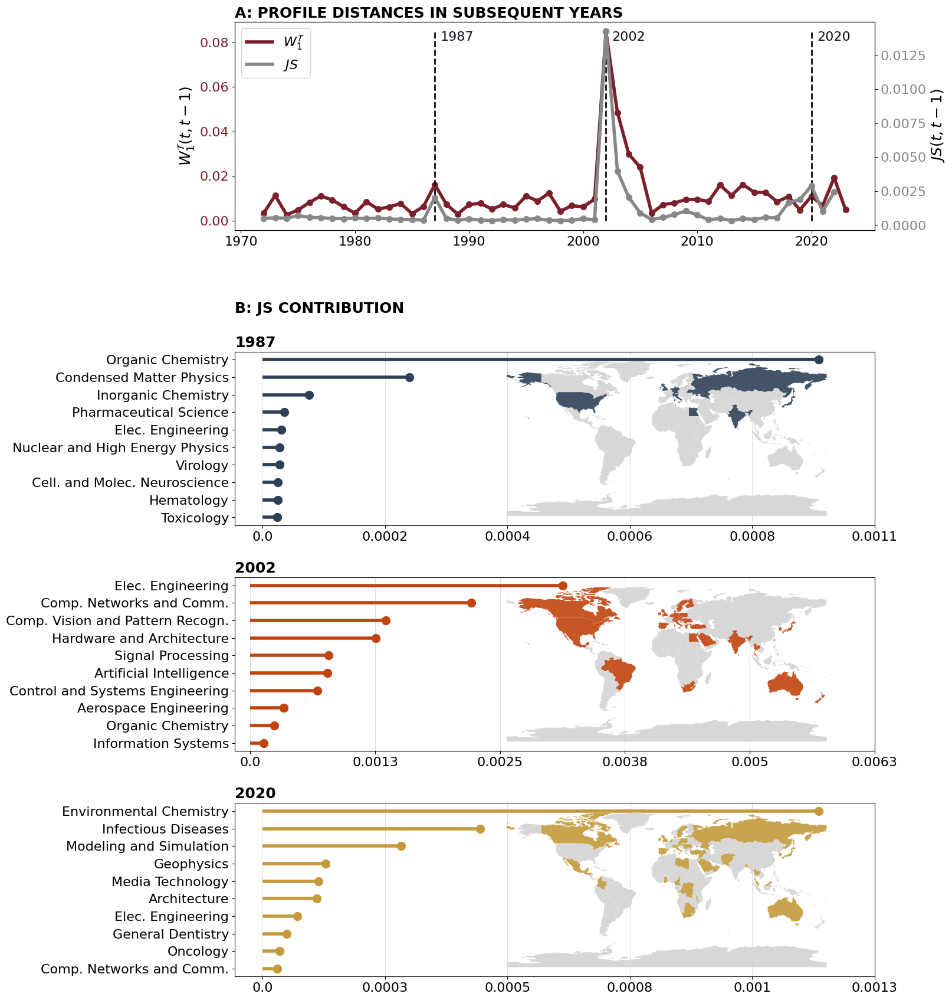

In [41]:
fig, axes = plt.subplots(
    5, 1,
    figsize=(14, 21),
    gridspec_kw={"hspace": 0.35},
    height_ratios=[1.2, 0.1,  1, 1, 1]
)

ax1 = axes[0]
# --- Dati JS (già calcolato sopra, altrimenti ricalcola) ---
profiles = pd.read_csv('../data/aggregatePapersBySubfieldByYear.csv')
subfield_cols = [c for c in profiles.columns if c != 'year']
profiles[subfield_cols] = profiles[subfield_cols].div(profiles[subfield_cols].sum(axis=1), axis=0)


dfJScontrib = pd.DataFrame(columns=subfield_cols)
for y in range(1972, 2023):
    P = profiles[profiles['year'] == y-1][subfield_cols].values[0]
    Q = profiles[profiles['year'] == y  ][subfield_cols].values[0]
    M = 0.5 * (P + Q)
    js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
               + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
    dfJScontrib.loc[y] = js_contrib
dfJS = dfJScontrib.sum(axis=1).reset_index().rename(columns={'index': 'year', 0: 'JS_divergence'})

# --- Dati W1 ---
dfw1 = pd.read_csv('../data/w1dist_aggregate_year.csv')
dfw1 = dfw1[dfw1['year_to'] >= 1972]

# --- Plot ---
color_w1 = '#903498'
# color_w1 = "#4040a0"
color_w1 = "#7A1F2B"
color_js = '#888888'

marker_w1 = ""
marker_js = ""

vline_years = [1987, 2002, 2020]

ax2 = ax1.twinx()

def plot_metric(ax, x, y, color):
    #ax.vlines(x, 0, y, color=color, linewidth=1, alpha=0.7)
    # ax.plot(x, y, 'ok', markersize=4)
    ax.plot(x, y, 'o', color=color, markersize=7)
    ax.plot(x, y, color=color, linewidth=4)

plot_metric(ax1, dfw1['year_to'], dfw1['distance'],      color_w1)
plot_metric(ax2, dfJS['year'],    dfJS['JS_divergence'],  color_js)

for yr in vline_years:
    ax1.vlines(x=yr, ymin=0, ymax=max(dfw1['distance']), color=DARK_GREY, linestyle='--', linewidth=2)
    ax1.text(
        yr+0.5,
        max(dfw1['distance']),
        str(yr),
        va='top',
        ha='left',
        color=DARK_GREY,
        fontsize=base_fontsize,
    )

ax1.set_xlabel('Year')
ax1.set_ylabel(r'$W_1^{\mathcal{T}}(t, t-1)$', color='black', fontsize=base_fontsize+2, fontweight='bold')
ax2.set_ylabel(r'$JS(t, t-1)$',  color='black', fontsize=base_fontsize+2, fontweight='bold')
ax1.tick_params(axis='y', labelcolor=color_w1,labelsize=base_fontsize)
ax2.tick_params(axis='y', labelcolor=color_js,labelsize=base_fontsize)
ax1.set_title("A: PROFILE DISTANCES IN SUBSEQUENT YEARS",
              fontsize=base_fontsize+2,
              fontweight="bold",
              loc="left")

# Legenda
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], color=color_w1, linewidth=4, label=r'$W_1^{\mathcal{T}}$'),
                   Line2D([0], [0], color=color_js,  linewidth=4, label=r'$JS$')]
ax1.legend(handles=legend_elements, loc='upper left', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=base_fontsize)
ax1.set_xlabel(None)
# plt.show()

ax2 = axes[1]
ax2.axis("off")
ax2.text(0, -0.1, "B: JS CONTRIBUTION", va="top", ha="left", fontsize=base_fontsize+2, fontweight="bold")

years = [1987, 2002, 2020]   # replace with your years
ycolor={1987: '#2E4057', 2002: '#C1440E', 2020: '#C49A3C'}
i = 1
for ax_bar, y in zip(axes[2:], years):

    # -----------------------
    # BAR PLOT
    # -----------------------
    contrib = dfJScontrib.loc[y].sort_values(ascending=False)
    top10 = contrib.head(10)

    max_contrib = top10.values.max()

    ax_bar.hlines(
        top10.index,
        0,
        top10.values,
        color=ycolor[y],
        linewidth=4
    )

    ax_bar.plot(
        top10.values,
        top10.index,
        'o',
        color=ycolor[y],
        markersize=10
    )

    ax_bar.invert_yaxis()

    # ax_bar.set_xlabel(
    #     "JS contribution",
    #     fontsize=base_fontsize
    # )

    ax_bar.grid(axis="x", alpha=0.4)

    ax_bar.set_yticks(
        top10.index,
        [
            subfieldid2name[int(i)]
            if subfieldid2name[int(i)] not in topics_dict.keys()
            else topics_dict[subfieldid2name[int(i)]]
            for i in top10.index
        ],
        fontsize=base_fontsize
    )

    ax_bar.set_xticks(
        np.linspace(0, max_contrib*coef_dict[y], 6)
    )

    ax_bar.set_xticklabels(
        np.round(
            np.linspace(0, max_contrib*coef_dict[y], 6),
            4
        ),
        fontsize=base_fontsize
    )


    # -----------------------
    # MAP OVERLAY
    # -----------------------
    pos = ax_bar.get_position()

    ax_map = fig.add_axes(
        [
            pos.x0 + 0.4*pos.width,
            pos.y0,
            0.55*pos.width,
            pos.height
        ],
        facecolor="none"
    )

    world['component'] = [
        1 if iso in country_dict[y] else 0
        for iso in world['ISO_A3']
    ]
    colors = ["lightgray", ycolor[y], "white"]
    cmap = mcolors.ListedColormap(colors)
    norm = mcolors.BoundaryNorm(boundaries=range(len(colors) + 1), ncolors=len(colors))
    world.plot(
        column="component",
        ax=ax_map,
        cmap=cmap,
        norm=norm,
        alpha=0.9
    )

    ax_map.set_axis_off()
    ax_map.set_facecolor("none")
    ax_map.set_zorder(3)

    ax_bar.set_title(
        str(y),
        fontsize=base_fontsize+2,
        fontweight="bold",
        loc="left"
    )
    i+=1


fig.savefig(f"../images/wt_js_contribution_v1.jpg", dpi=1000, bbox_inches='tight')

In [52]:
world = world[world["CONTINENT"] != "Antarctica"]

/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3044552104.py:30: RuntimeWarning: invalid value encountered in divide
  js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3044552104.py:31: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3044552104.py:30: RuntimeWarning: invalid value encountered in divide
  js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3044552104.py:31: RuntimeWarning: invalid value encountered in divide
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83877/3044552104.py:31: RuntimeWarning: divide by zero encountered in log
  + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
/var/folders/kq/3vlmcmh917x4z481rl4yj6t00000gn/T/ipykernel_83

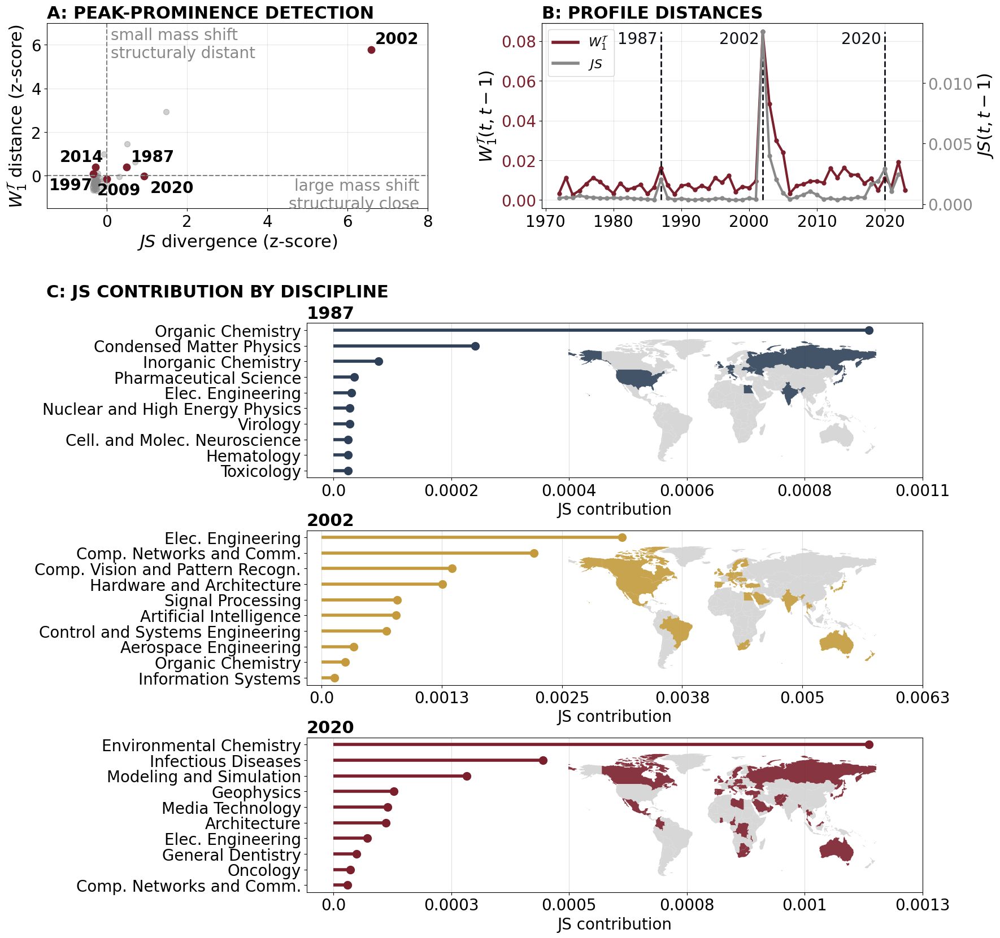

In [55]:
fig = plt.figure(figsize=(20, 20))

outer = fig.add_gridspec(
    5, 1,
    height_ratios=[1.2, 0.06, 1, 1, 1],
    hspace=0.4
)

base_fontsize = 20
# Top row

top = outer[0].subgridspec(1, 2, wspace=0.3)

ax1 = fig.add_subplot(top[0, 1])

ax2 = fig.add_subplot(top[0, 0])


# --- Dati JS (già calcolato sopra, altrimenti ricalcola) ---
profiles = pd.read_csv('../data/aggregatePapersBySubfieldByYear.csv')
subfield_cols = [c for c in profiles.columns if c != 'year']
profiles[subfield_cols] = profiles[subfield_cols].div(profiles[subfield_cols].sum(axis=1), axis=0)


dfJScontrib = pd.DataFrame(columns=subfield_cols)
for y in range(1972, 2023):
    P = profiles[profiles['year'] == y-1][subfield_cols].values[0]
    Q = profiles[profiles['year'] == y  ][subfield_cols].values[0]
    M = 0.5 * (P + Q)
    js_contrib = 0.5 * np.where(P > 0, P * np.log(P / M), 0) \
               + 0.5 * np.where(Q > 0, Q * np.log(Q / M), 0)
    dfJScontrib.loc[y] = js_contrib
dfJS = dfJScontrib.sum(axis=1).reset_index().rename(columns={'index': 'year', 0: 'JS_divergence'})

# --- Dati W1 ---
dfw1 = pd.read_csv('../data/w1dist_aggregate_year.csv')
dfw1 = dfw1[dfw1['year_to'] >= 1972]

# --- Plot ---
color_w1 = '#903498'
# color_w1 = "#4040a0"
color_w1 = "#7A1F2B"
color_js = '#888888'

marker_w1 = ""
marker_js = ""

vline_years = [1987, 2002, 2020]


ax12 = ax1.twinx()

def plot_metric(ax, x, y, color):
    #ax.vlines(x, 0, y, color=color, linewidth=1, alpha=0.7)
    # ax.plot(x, y, 'ok', markersize=4)
    ax.plot(x, y, 'o', color=color, markersize=5)
    ax.plot(x, y, color=color, linewidth=3)

plot_metric(ax1, dfw1['year_to'], dfw1['distance'],      color_w1)
plot_metric(ax12, dfJS['year'],    dfJS['JS_divergence'],  color_js)

for yr in vline_years:
    ax1.vlines(x=yr, ymin=0, ymax=max(dfw1['distance']), color=DARK_GREY, linestyle='--', linewidth=2)
    ax1.text(
        yr-0.5,
        max(dfw1['distance']),
        str(yr),
        va='top',
        ha='right',
        color=DARK_GREY,
        fontsize=base_fontsize,
    )

ax1.set_xlabel('Year')
ax1.set_ylabel(r'$W_1^{\mathcal{T}}(t, t-1)$', color='black', fontsize=base_fontsize+2, fontweight='bold')
ax12.set_ylabel(r'$JS(t, t-1)$',  color='black', fontsize=base_fontsize+2, fontweight='bold')
ax1.tick_params(axis='y', labelcolor=color_w1,labelsize=base_fontsize)
ax12.tick_params(axis='y', labelcolor=color_js,labelsize=base_fontsize)
ax1.set_title("B: PROFILE DISTANCES",
              fontsize=base_fontsize+2,
              fontweight="bold",
              loc="left")
ax1.grid(alpha=0.3)

# Legenda
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], color=color_w1, linewidth=4, label=r'$W_1^{\mathcal{T}}$'),
                   Line2D([0], [0], color=color_js,  linewidth=4, label=r'$JS$')]
ax1.legend(handles=legend_elements, loc='upper left', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=base_fontsize)
ax1.set_xlabel(None)
# plt.show()

# ax2 = axes[1]
# ax2.axis("off")
ax2.set_title("A: PEAK-PROMINENCE DETECTION", loc="left", fontsize=base_fontsize+2, fontweight="bold")
ax2.scatter(df_plot.zscore__y, df_plot.zscore__x, color="#888888", alpha=0.4, s=50)
ax2.axhline(0, color="grey", linestyle = "--")
ax2.axvline(0, color="grey", linestyle = "--")

year_list = [1997, 1987, 2002, 2009, 2014, 2020]

df_sel = df_plot.query("year in @year_list")
ax2.scatter(
    df_sel["zscore__y"],
    df_sel["zscore__x"],
    color="#7A1F2B",
    s=80
)

offset_dict = {
    1997: (-1.1, -0.9), 
    1987: (0.1, 0.1),
    2002: (0.1, 0.1), 
    2009: (-0.25, -0.9),
    2014: (-0.9, 0.1),
    2020: (0.15, -0.9),
}

for _, row in df_sel.iterrows():

    ax2.text(
        row["zscore__y"]+offset_dict[row["year"]][0],
        row["zscore__x"]+offset_dict[row["year"]][1],
        str(int(row["year"])),
        fontsize=base_fontsize,
        fontweight="bold",
        ha="left",
        va="bottom"
    )   

ax2.text(
    0.1,
    6.8,
    "small mass shift\nstructuraly distant",
    fontsize=base_fontsize,
    # fontweight="bold",
    color="#888888",
    ha="left",
    va="top"
)

ax2.text(
    7.8,
    -0.1,
    "large mass shift\nstructuraly close",
    fontsize=base_fontsize,
    # fontweight="bold",
    color="#888888",
    ha="right",
    va="top"
)

ax2.set_ylabel(r'$W_1^{\mathcal{T}}$ distance (z-score)', color='black', fontsize=base_fontsize+2)
ax2.set_xlabel(r'$JS$ divergence (z-score)', color='black', fontsize=base_fontsize+2)
ax2.tick_params(axis="both", labelsize=base_fontsize)
ax2.grid(alpha=0.3)
ax2.set_xlim(-1.5, 8)
ax2.set_ylim(-1.5, 7)

years = [1987, 2002, 2020]   # replace with your years
# ycolor={1987: '#2E4057', 2002: '#C1440E', 2020: '#C49A3C'}
color_w1 = "#7A1F2B"
ycolor={1987: '#2E4057', 2002: '#C49A3C', 2020: color_w1}
offset_title={1987: -0.00029, 2002: -0.0029, 2020: -0.00029}
# y = 2002
i = 1
for i, y in enumerate(years):

    # -----------------------
    # BAR PLOT
    # -----------------------
    ax_bar = fig.add_subplot(outer[i+2])
    pos = ax_bar.get_position()
    shift = 0.23

    ax_bar.set_position([
        pos.x0 + shift,   # shift right
        pos.y0,
        pos.width - shift,
        pos.height
    ])
    contrib = dfJScontrib.loc[y].sort_values(ascending=False)
    top10 = contrib.head(10)

    max_contrib = top10.values.max()
    # ax3.set_title("B: PEAK-PROMINENCE DETECTION", loc = "left", fontsize=base_fontsize+2, fontweight="bold")
    ax_bar.hlines(
            top10.index,
            0,
            top10.values,
            color=ycolor[y],
            linewidth=4
    )

    ax_bar.plot(
            top10.values,
            top10.index,
            'o',
            color=ycolor[y],
            markersize=10
    )

    ax_bar.invert_yaxis()

    ax_bar.set_xlabel(
        "JS contribution",
        fontsize=base_fontsize
    )

    ax_bar.grid(axis="x", alpha=0.4)

    ax_bar.set_yticks(
            top10.index,
            [
                subfieldid2name[int(i)]
                if subfieldid2name[int(i)] not in topics_dict.keys()
                else topics_dict[subfieldid2name[int(i)]]
                for i in top10.index
            ],
            fontsize=base_fontsize
    )

    ax_bar.set_xticks(
            np.linspace(0, max_contrib*coef_dict[y], 6)
    )

    ax_bar.set_xticklabels(
            np.round(
                np.linspace(0, max_contrib*coef_dict[y], 6),
                4
            ),
            fontsize=base_fontsize
    )

        # -----------------------
        # MAP OVERLAY
        # -----------------------
    pos = ax_bar.get_position()

    ax_map = fig.add_axes(
        [
            pos.x0 + 0.4*pos.width,
            pos.y0,
            0.55*pos.width,
            pos.height
        ],
        facecolor="none"
    )

    world['component'] = [
        1 if iso in country_dict[y] else 0
        for iso in world['ISO_A3']
    ]
    colors = ["lightgray", ycolor[y], "white"]
    cmap = mcolors.ListedColormap(colors)
    norm = mcolors.BoundaryNorm(boundaries=range(len(colors) + 1), ncolors=len(colors))
    world.plot(
        column="component",
        ax=ax_map,
        cmap=cmap,
        norm=norm,
        alpha=0.9
    )

    ax_map.set_axis_off()
    ax_map.set_facecolor("none")
    ax_map.set_zorder(3)

    ax_bar.set_title(y, fontweight="bold", fontsize=base_fontsize+2, loc="left")

ax_title = fig.add_subplot(outer[1])
ax_title.set_axis_off()
ax_title.text(
    offset_title[y], -1.5,
    f"C: JS CONTRIBUTION BY DISCIPLINE",
    fontsize=base_fontsize+2,
    fontweight="bold",
    va="top", ha="left"
)


fig.savefig(f"../images/wt_js_contribution_peaks_full_v3.jpg", dpi=1000, bbox_inches='tight')

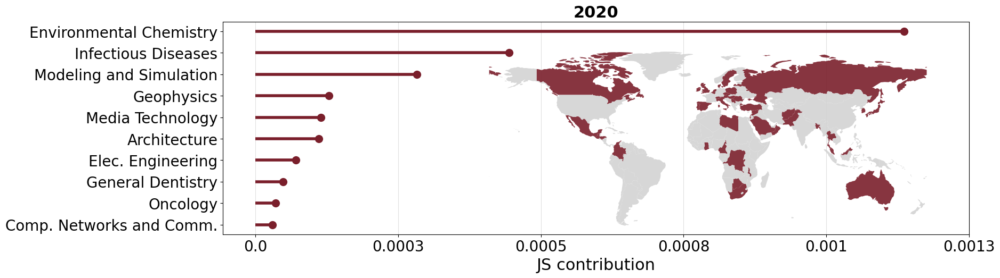

In [43]:
import matplotlib.pyplot as plt
import geopandas as gpd

y = 2020
base_fontsize=20

url = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)
world = world[world["CONTINENT"] != "Antarctica"]
#merge with df_cc (quello non presente avrà component 0)

world['component']=[1 if iso in country_dict[y] else 0 for iso in world['ISO_A3']]

colors = [
    "lightgray",
    ycolor[y],
    "#C1440E",  # Terracotta
    "#4A7C59",  # Verde salvia
    "#8B5E3C",  # Marrone caldo
    "#6B4C82",  # Viola scuro
    "#C49A3C",  # Ocra dorata
    "#2A7F8F",  # Teal profondo
    "#B5432A",  # Rosso mattone
    "#5C7A3E",  # Verde oliva
    "#7A3B4B",  # Bordeaux
]

cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=range(len(colors) + 1), ncolors=len(colors))

fig = plt.figure(figsize=(14, 4))

# -----------------------
# MAIN PLOT: BAR PLOT
# -----------------------
ax_bar = fig.add_axes([0, 0, 1, 1])  # big main area

contrib = dfJScontrib.loc[y].sort_values(ascending=False)
top10 = contrib.head(10)

max_contrib = top10.values.max()
# max_contrib = 0.005

ax_bar.hlines(top10.index, 0, top10.values,
              color=ycolor[y], linewidth=4)

ax_bar.plot(top10.values, top10.index,
            'o', color=ycolor[y], markersize=10)

ax_bar.invert_yaxis()
ax_bar.set_xlabel("JS contribution", fontsize=base_fontsize+2)
# ax.set_xticks(fontsize=14)
ax_bar.grid(axis='x', alpha=0.4)
ax_bar.set_yticks(top10.index, [subfieldid2name[int(i)] if not (subfieldid2name[int(i)] in topics_dict.keys()) else topics_dict[subfieldid2name[int(i)]] for i in top10.index], fontsize=base_fontsize)
ax_bar.set_xticks(np.linspace(0, max_contrib*coef_dict[y], 6))
ax_bar.set_xticklabels(np.round(np.linspace(0, max_contrib*coef_dict[y], 6), 4), fontsize=base_fontsize)

# -----------------------
# INSET MAP (overlay)
# -----------------------
ax_map = fig.add_axes(
    [0.2, 0, 0.9, 0.9],   # position inside bar plot
    facecolor="none"
)

world.plot(
    column="component",
    ax=ax_map,
    cmap=cmap,
    norm=norm,
    alpha=0.9
)

ax_map.set_axis_off()
ax_map.set_facecolor("none")
ax_map.set_zorder(3)

_ = ax_bar.set_title(y, fontsize=base_fontsize+2, fontweight="bold")

# fig.savefig(f"../map_js_contribution_{y}_v1.jpg", dpi=1000, bbox_inches='tight')

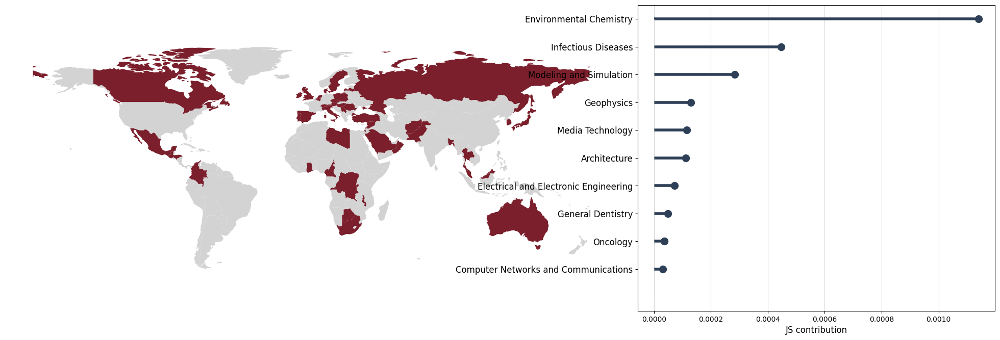

In [44]:
import matplotlib.pyplot as plt
import geopandas as gpd
import matplotlib.colors as mcolors

fig = plt.figure(figsize=(20, 10))

# -----------------------
# AXES 1: WORLD MAP
# -----------------------
ax_map = fig.add_axes([0.0, 0.0, 0.6, 1.0])   # left, bottom, width, height

world.plot(column="component", ax=ax_map, cmap=cmap, norm=norm)

ax_map.set_axis_off()
ax_map.set_facecolor('none')


# -----------------------
# AXES 2: TOP 10 PLOT
# -----------------------
ax_bar = fig.add_axes([0.62, 0.2, 0.35, 0.6])  # right panel

contrib = dfJScontrib.loc[y].sort_values(ascending=False)
top10 = contrib.head(10)
y = 1987  # Example year, you can change this to 2002 or 2020 as needed

ax_bar.hlines(
    top10.index,
    0,
    top10.values,
    color=ycolor[y],
    linewidth=4
)

ax_bar.plot(
    top10.values,
    top10.index,
    'o',
    color=ycolor[y],
    markersize=10
)

ax_bar.vlines(
    x=0,
    ymin=0,
    ymax=10,
    color='lightgray',
    linestyle='--',
    linewidth=0.5
)

ax_bar.set_yticks(top10.index)
ax_bar.set_yticklabels(
    [subfieldid2name[int(i)] for i in top10.index],
    fontsize=12
)

ax_bar.invert_yaxis()
ax_bar.set_xlabel('JS contribution', fontsize=12)
ax_bar.grid(axis='x', alpha=0.5)


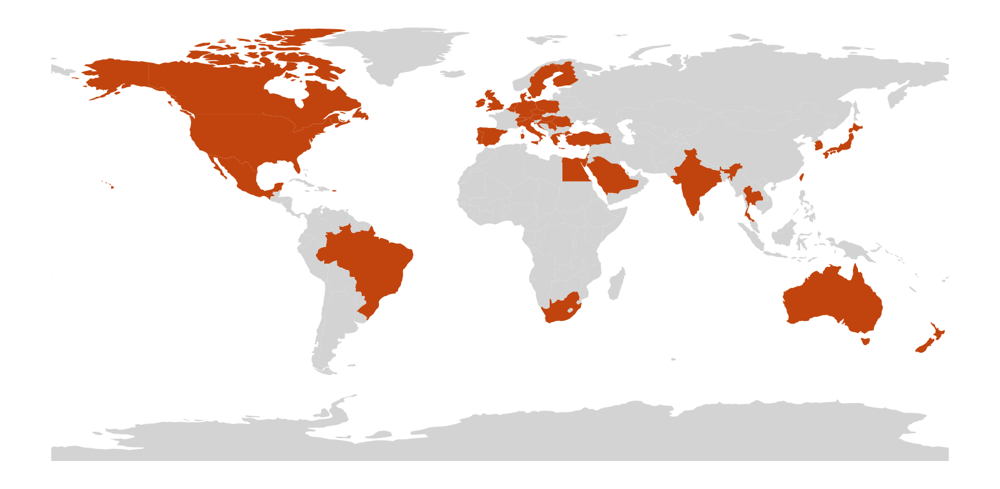

In [45]:
url = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)
#merge with df_cc (quello non presente avrà component 0)
world['component']=[1 if iso in countries2002ISO else 0 for iso in world['ISO_A3']]

colors = [
    "lightgray",
    "#C1440E",  # Terracotta
    "#4A7C59",  # Verde salvia
    "#8B5E3C",  # Marrone caldo
    "#6B4C82",  # Viola scuro
    "#C49A3C",  # Ocra dorata
    "#2A7F8F",  # Teal profondo
    "#B5432A",  # Rosso mattone
    "#5C7A3E",  # Verde oliva
    "#7A3B4B",  # Bordeaux
]

cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=range(len(colors) + 1), ncolors=len(colors))

fig, ax = plt.subplots(figsize=(20, 10))
world.plot(column="component", ax=ax, cmap=cmap, norm=norm)
#remove axis
ax.set_axis_off()
ax.set_facecolor('none')
plt.savefig('map2002.png', bbox_inches='tight', pad_inches=0, transparent=True)
plt.show()

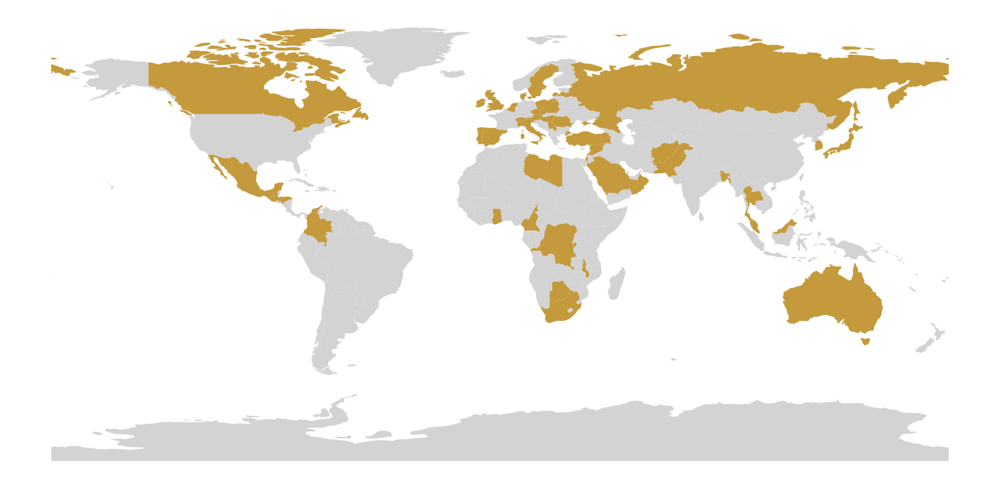

In [46]:
url = "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)
#merge with df_cc (quello non presente avrà component 0)
world['component']=[1 if iso in countries2020ISO else 0 for iso in world['ISO_A3']]

colors = [
    "lightgray",
    "#C49A3C",  # Ocra dorata
    "#2A7F8F",  # Teal profondo
    "#B5432A",  # Rosso mattone
    "#5C7A3E",  # Verde oliva
    "#7A3B4B",  # Bordeaux
]

cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=range(len(colors) + 1), ncolors=len(colors))

fig, ax = plt.subplots(figsize=(20, 10))
world.plot(column="component", ax=ax, cmap=cmap, norm=norm)
#remove axis
ax.set_axis_off()
ax.set_facecolor('none')
plt.savefig('map2020.png', bbox_inches='tight', pad_inches=0, transparent=True)
plt.show()

## SPECIALIZATION- GENERALIZATION

In [47]:
dd=dfInfo[dfInfo['nPapersUnique']>=100]
years=range(1970,2024)

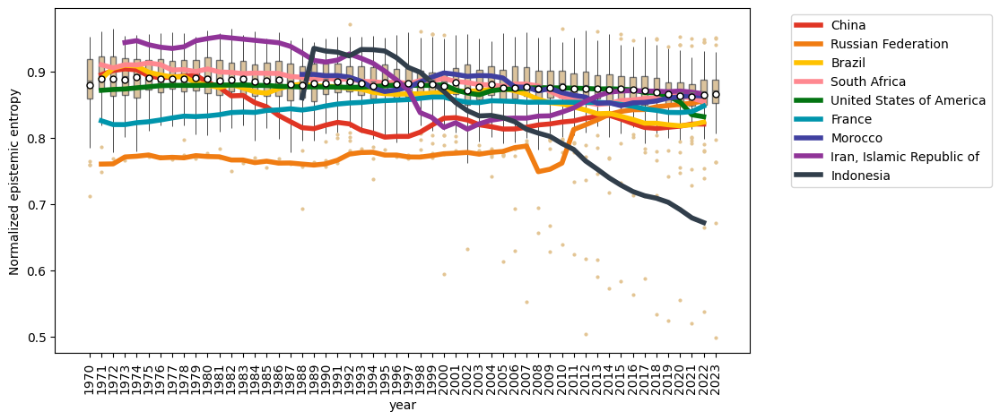

In [48]:
plt.figure(figsize=(10,5))


sns.boxplot(data=dd, x='year', y='normEntropy', order=years,
            color='#e3c594', width=0.5, showfliers=True, showmeans=True,
            meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"black", "markersize":"5"},
            whiskerprops={"color":"black", "linewidth":0.5},
            capprops={"color":"black", "linewidth":0},
            flierprops={"marker":"o", "markerfacecolor":"#e3c594", "markeredgecolor":"#e3c594", "markersize":2},
            saturation=0.8)

for i in selCountries:
    dfTemp = dd[dd['country'] == i].sort_values('year').copy()
    dfTemp['normEntropy_smooth'] = dfTemp['normEntropy'].rolling(window=3, center=True).mean()
    x_pos = [years.index(y) for y in dfTemp['year']]
    plt.plot(x_pos, dfTemp['normEntropy_smooth'],color=colorsCountries[selCountries.index(i)],  label=id2nameC[i], linewidth=4)
    


plt.legend()
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Normalized epistemic entropy')
#plt.grid()
plt.show()

In [49]:
dfEntrW=pd.read_csv('../data/df_tree_entropy_countries_time.csv')
dfEntrW=dfEntrW.merge(dfInfo, on=['country','year'], how='right')
dfEntrW=dfEntrW[dfEntrW['nPapers']>=500].query("year>=1973")


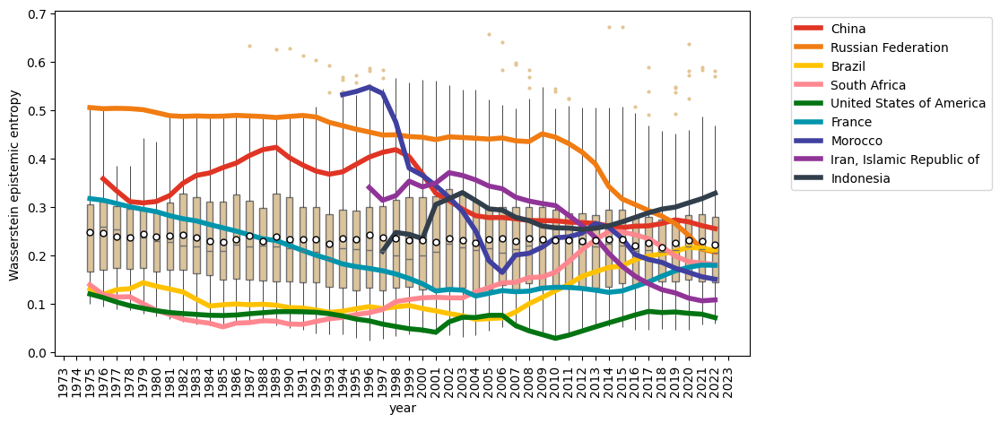

In [50]:
plt.figure(figsize=(10,5))


sns.boxplot(data=dfEntrW, x='year', y='tree_entropy', order=years,
            color='#e3c594', width=0.5, showfliers=True, showmeans=True,
            meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"black", "markersize":"5"},
            whiskerprops={"color":"black", "linewidth":0.5},
            capprops={"color":"black", "linewidth":0},
            flierprops={"marker":"o", "markerfacecolor":"#e3c594", "markeredgecolor":"#e3c594", "markersize":2},
            saturation=0.8)

for i in selCountries:
    dfTemp = dfEntrW[dfEntrW['country'] == i].sort_values('year').copy()
    x_pos = [years.index(y) for y in dfTemp['year']]
    plt.plot(x_pos, dfTemp['tree_entropy'],color=colorsCountries[selCountries.index(i)],  label=id2nameC[i], linewidth=4)
    


plt.legend()
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Wasserstein epistemic entropy')
#plt.grid()
plt.show()

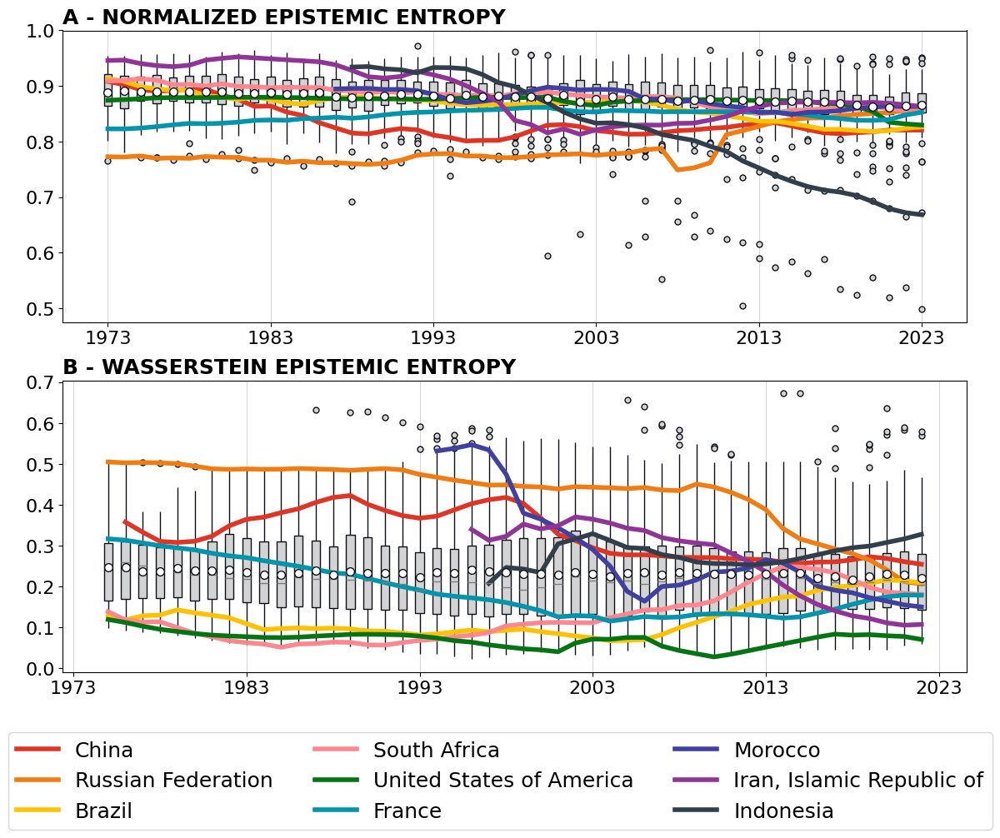

In [51]:
fig, (ax1, ax2) = plt.subplots(figsize=(14, 10), nrows=2, height_ratios=[1, 1])

base_fontsize = 16

dd=dfInfo[dfInfo['nPapersUnique']>=100].query("year >= 1973")

years=range(1973,2024)

years_pos = np.arange(0, len(years), 10).astype(int)
years_plot = np.arange(1973, 2024, 10).astype(str)

sns.boxplot(data=dd, x='year', y='normEntropy', order=years,
            color='lightgrey', width=0.5, showfliers=True, showmeans=True,
            boxprops={"edgecolor": "#0D1117", "linewidth": 1, "facecolor": "lightgrey"},
            meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"#0D1117", "markersize":"7",},
            whiskerprops={"color":"#0D1117", "linewidth":1},
            capprops={"color":"#0D1117", "linewidth":0},
            flierprops={"marker":"o", "markerfacecolor":"lightgrey", "markeredgecolor":"#0D1117", "markersize":5},
            saturation=0.8, ax=ax1)

for i in selCountries:
    dfTemp = dd[dd['country'] == i].sort_values('year').copy()
    dfTemp['normEntropy_smooth'] = dfTemp['normEntropy'].rolling(window=3, center=True, min_periods=1).mean()
    x_pos = [years.index(y) for y in dfTemp['year']]
    ax1.plot(x_pos, dfTemp['normEntropy_smooth'],color=colorsCountries[selCountries.index(i)],  label=id2nameC[i], linewidth=4)
    
ax1.set_xticks(years_pos)
ax1.set_xticklabels(years_plot, fontsize=base_fontsize)

ax1.set_yticks(np.linspace(0.5, 1, 6))
ax1.set_yticklabels(np.linspace(0.5, 1, 6), fontsize=base_fontsize)

ax1.set_xlabel(None)
ax1.set_ylabel(None)

ax1.set_title("A - NORMALIZED EPISTEMIC ENTROPY", fontsize=18, loc="left", fontweight='bold')
ax1.grid(axis='x', linestyle='-', alpha=0.5)
#plt.grid()

sns.boxplot(data=dfEntrW, x='year', y='tree_entropy', order=years,
            color='lightgrey', width=0.5, showfliers=True, showmeans=True,
            boxprops={"edgecolor": "#0D1117", "linewidth": 1, "facecolor": "lightgrey"},
            meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"#0D1117", "markersize":"7"},
            whiskerprops={"color":"#0D1117", "linewidth":1},
            capprops={"color":"#0D1117", "linewidth":0},
            flierprops={"marker":"o", "markerfacecolor":"lightgrey", "markeredgecolor":"#0D1117", "markersize":5},
            saturation=0.8, ax=ax2)

for i in selCountries:
    dfTemp = dfEntrW[dfEntrW['country'] == i].sort_values('year').copy()
    x_pos = [years.index(y) for y in dfTemp['year']]
    ax2.plot(x_pos, dfTemp['tree_entropy'],color=colorsCountries[selCountries.index(i)],  linewidth=4)
    
ax2.set_xticks(years_pos)
ax2.set_xticklabels(years_plot, fontsize=base_fontsize)

ax2.set_yticks(np.linspace(0, 0.7, 8))
ax2.set_yticklabels(np.round(np.linspace(0, 0.7, 8), 1), fontsize=base_fontsize)

ax2.set_xlabel(None)
ax2.set_ylabel(None)
ax2.set_title("B - WASSERSTEIN EPISTEMIC ENTROPY", fontsize=18, loc="left", fontweight='bold')
ax2.grid(axis='x', linestyle='-', alpha=0.5)

_ = fig.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, 0.05),  # slightly above the plot
    ncol=3,
    frameon=True,
    fontsize=18,
)

# plt.show()
plt.savefig('../fig_entropy_v1.jpg', dpi=1000, bbox_inches='tight')